In [1]:
from pathlib import Path

# Where does everything live ? Everything sits inside the repository now, so the
# notebooks are in <repo>/notebooks and every data folder is a sibling of that one. We
# work the repository out from the notebook's own location, which means you can rename
# the repository or move it somewhere else entirely and not a single path below breaks.
NOTEBOOKS = Path.cwd()
REPO      = NOTEBOOKS.parent

# Running this from somewhere other than the notebooks folder ? Then uncomment the line
# below, point it at the repository and everything underneath it keeps working.
# REPO = Path("/Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics")

# The heavy folders live inside the repository, which means git would cheerfully try to
# take all 2.8 GB of them if we let it. Every one of them is named in .gitignore
# instead, so they sit right here beside the code while never reaching GitHub. One
# warning follows from that. Never run git clean -x in here, because that is the command
# which deletes ignored files and the recordings cannot be made a second time.
RECORDINGS = REPO / "recordings"   # the vrs files, far too big for git
MODELS     = REPO / "models"       # yolo and sam weights, downloadable again
CACHE      = REPO / "cache"        # exported frames, the mp4, cached centroids
OUTPUTS    = REPO / "outputs"      # the deliverables, and these do go in git

# Anything we write into should exist before we try to write into it.
OUTPUTS.mkdir(parents=True, exist_ok=True)
CACHE.mkdir(parents=True, exist_ok=True)

print("repo:      ", REPO)
print("recordings:", RECORDINGS)
print("models:    ", MODELS)
print("cache:     ", CACHE)
print("outputs:   ", OUTPUTS)

# A wrong working directory would quietly send every write below into some other folder,
# and we would only find out much later when a file turns up missing. So we stop here
# instead of guessing.
assert RECORDINGS.is_dir(), f"no recordings folder at {RECORDINGS}, set REPO by hand above"
assert MODELS.is_dir(),     f"no models folder at {MODELS}, set REPO by hand above"

repo:       /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics
recordings: /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/recordings
models:     /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/models
cache:      /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/cache
outputs:    /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/outputs


[ProgressLogger][INFO]: 2026-09-25 01:55:24: Opening /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/recordings/pouring_scooping_1_20260918_160639.vrs...
[TelemetryLogger][INFO]: RecordFileReader::doOpenFile, diskfile: success, 969970952
[VRSIndexRecord][WARNING]: 12 record(s) not sorted properly. Sorting index.
[MultiRecordFileReader][DEBUG]: Opened file '/Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/recordings/pouring_scooping_1_20260918_160639.vrs' and assigned to reader #0
[VrsDataProvider][INFO]: streamId 211-1/camera-et-left activated
[VrsDataProvider][INFO]: streamId 211-2/camera-et-right activated
[VrsDataProvider][INFO]: streamId 214-1/camera-rgb activated
[VrsDataProvider][INFO]: streamId 231-1/mic activated
[VrsDataProvider][INFO]: streamId 246-1/temperature activated
[VrsDataProvider][INFO]: streamId 247-1/baro0 activated
[VrsDataProvider][INFO]: streamId 248-1/ppg activated


frame shape: (1512, 2016, 3)
frame dtype: uint8
captured at: 698123621554


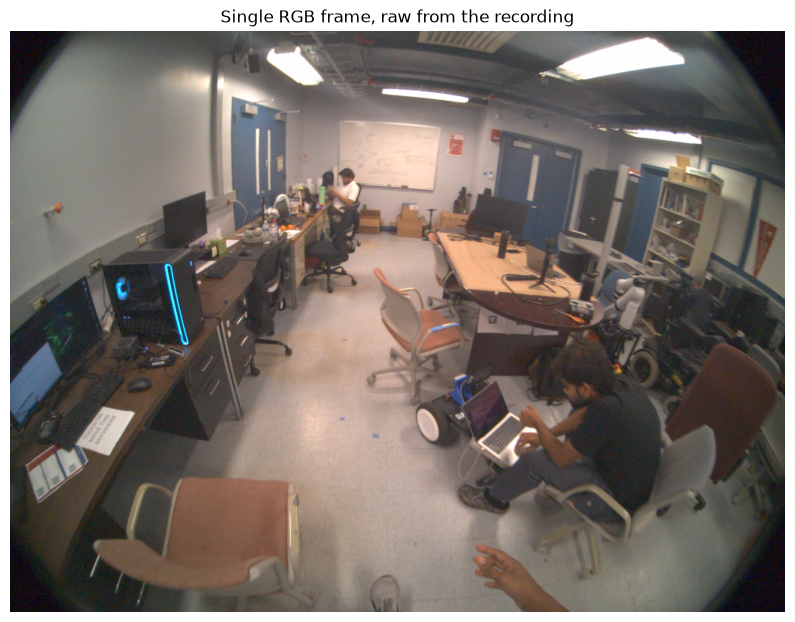

In [2]:
from projectaria_tools.core import data_provider
from projectaria_tools.core.sensor_data import TimeDomain, TimeQueryOptions
import matplotlib.pyplot as plt
import numpy as np

vrs_file_path = str(RECORDINGS / "pouring_scooping_1_20260918_160639.vrs")
vrs_data_provider = data_provider.create_vrs_data_provider(vrs_file_path)

rgb_stream_id = vrs_data_provider.get_stream_id_from_label("camera-rgb")

# We pick a frame from the middle of one of the active periods rather than the
# start, because the start is the wearer settling and there may be nothing in
# view yet. Around forty seconds was one of the busiest stretches on the speed
# plot, so that is where the objects are most likely to be in hand.
first_ns = vrs_data_provider.get_first_time_ns(rgb_stream_id, TimeDomain.DEVICE_TIME)
target_ns = first_ns + int(40e9)

image_data, image_record = vrs_data_provider.get_image_data_by_time_ns(
    rgb_stream_id, target_ns, TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST
)

frame = image_data.to_numpy_array()

# Before we hand anything to a detector, we should look at what we actually got.
# Is the image the right way up ? Is it the shape we expect ? For eg. the RGB
# camera on this profile should be 2016 by 1512 with three colour channels.
print("frame shape:", frame.shape)
print("frame dtype:", frame.dtype)
print("captured at:", image_record.capture_timestamp_ns)

plt.figure(figsize=(10, 8))
plt.imshow(frame)
plt.axis("off")
plt.title("Single RGB frame, raw from the recording")
plt.show()

detections: 12

chair           0.87   box (932, 614) to (1183, 971)
chair           0.71   box (210, 1156) to (747, 1511)
chair           0.67   box (753, 451) to (908, 684)
chair           0.58   box (1699, 809) to (2005, 1177)
chair           0.52   box (1390, 1019) to (1841, 1337)
tv              0.52   box (393, 416) to (515, 569)
chair           0.47   box (598, 545) to (740, 864)
mouse           0.41   box (301, 899) to (368, 940)
person          0.33   box (841, 352) to (914, 473)
dining table    0.32   box (1111, 519) to (1556, 786)
chair           0.31   box (1200, 1074) to (1999, 1511)
chair           0.28   box (753, 528) to (901, 682)


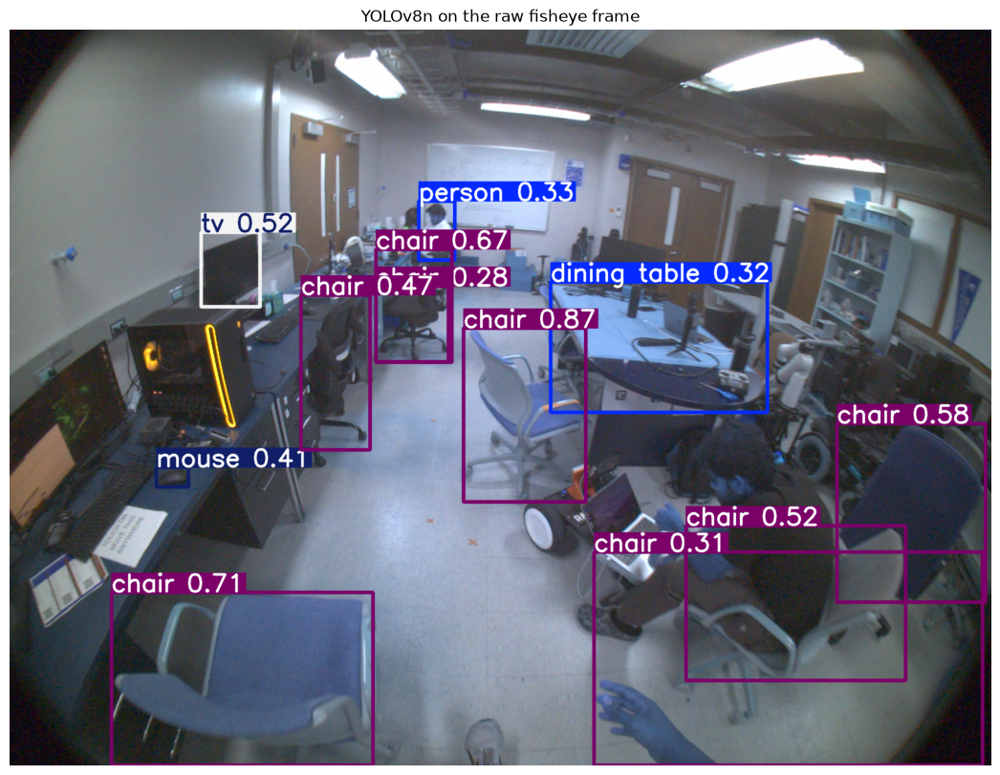

In [3]:
from ultralytics import YOLO

# We start with the small model. If it cannot find anything then a bigger one
# will not save us. If it works then we have a fast baseline to build on.
model = YOLO(str(MODELS / "yolov8n.pt"))

# We run on the raw fisheye frame deliberately. The detector was trained on
# ordinary photographs, so this tells us how much the distortion actually costs
# us before we spend time building an undistortion step.
results = model(frame, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}")
print()

# We list what it found with its confidence, so we can judge quality rather than
# just counting boxes. Is a detection at 0.3 useful to us ? Probably not, but we
# want to see the spread before choosing a cut off.
for box in r.boxes:
    label = model.names[int(box.cls)]
    conf = float(box.conf)
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    print(f"{label:<15} {conf:.2f}   box ({x1:.0f}, {y1:.0f}) to ({x2:.0f}, {y2:.0f})")

# The annotated image is the quickest way to see whether the boxes sit on the
# right things, especially near the edges where the distortion is worst.
annotated = r.plot()

plt.figure(figsize=(14, 10))
plt.imshow(annotated[:, :, ::-1])   # plot() returns BGR, matplotlib wants RGB
plt.axis("off")
plt.title("YOLOv8n on the raw fisheye frame")
plt.show()

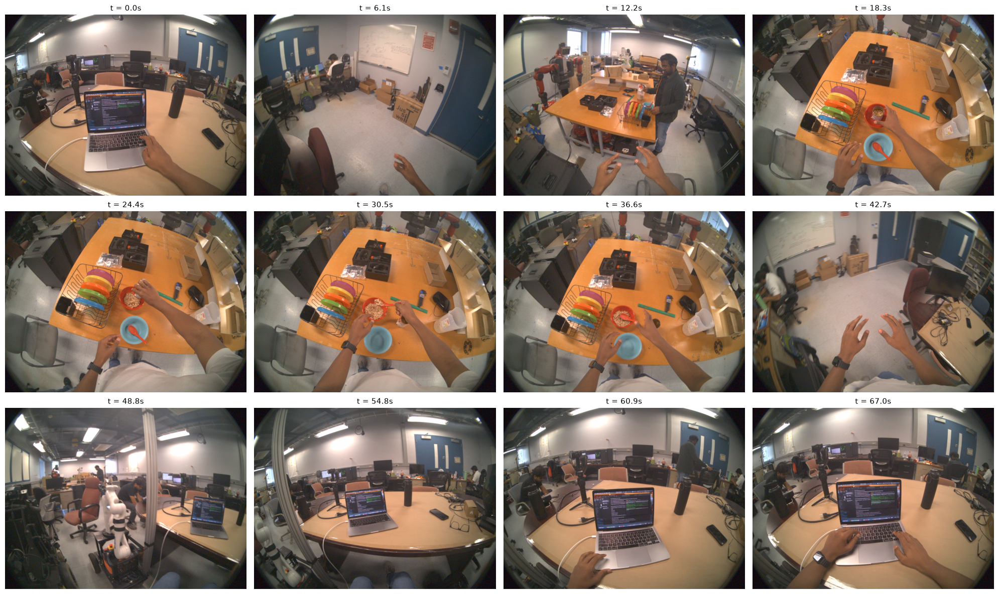

In [4]:
# We have been guessing which moment to look at. Instead, let us sample evenly
# across the whole recording and look at all of them at once. A contact sheet
# like this answers a question the numbers cannot: when is the task in view ?
n_frames = 12

last_ns = vrs_data_provider.get_last_time_ns(rgb_stream_id, TimeDomain.DEVICE_TIME)
sample_times = np.linspace(first_ns, last_ns, n_frames)

fig, axes = plt.subplots(3, 4, figsize=(20, 12))

for ax, t_ns in zip(axes.flat, sample_times):
    img_data, img_rec = vrs_data_provider.get_image_data_by_time_ns(
        rgb_stream_id, int(t_ns), TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST
    )
    ax.imshow(img_data.to_numpy_array())
    # Seconds from the start is more useful to us than a raw device timestamp,
    # because it lines up with the x axis of the speed plot we already have.
    seconds = (img_rec.capture_timestamp_ns - first_ns) / 1e9
    ax.set_title(f"t = {seconds:.1f}s", fontsize=11)
    ax.axis("off")

plt.tight_layout()
plt.show()

detections: 11

donut           0.41
dining table    0.37
donut           0.30
donut           0.30
donut           0.25
chair           0.21
bottle          0.21
donut           0.18
person          0.17
person          0.16
toilet          0.15


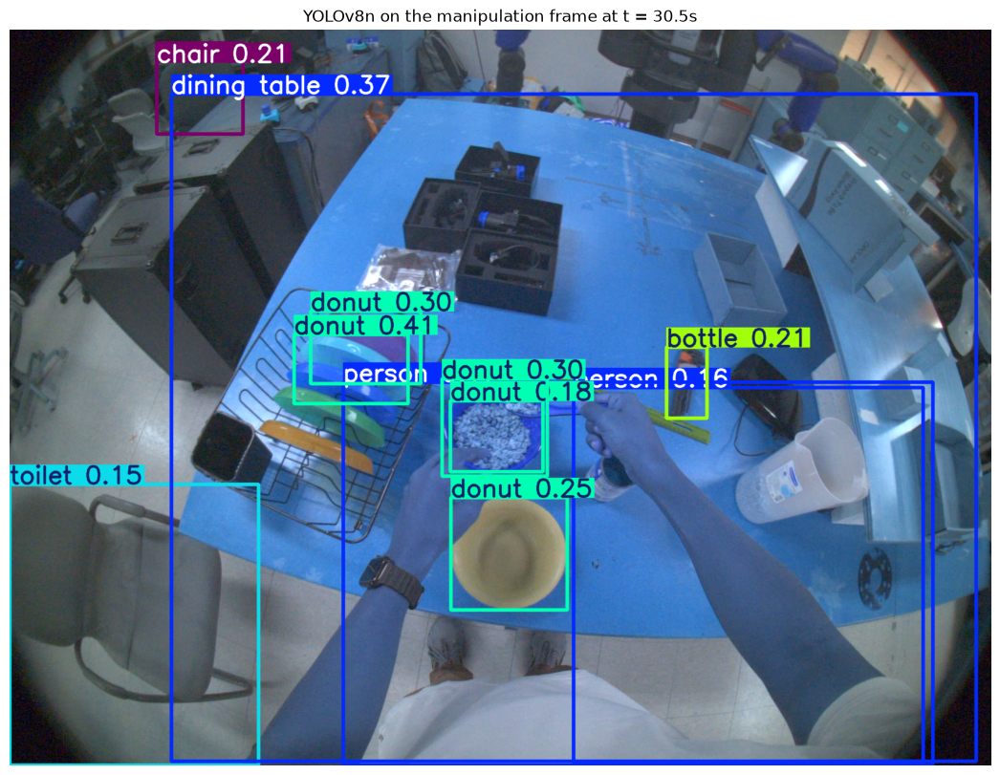

In [5]:
# The contact sheet showed the real task between eighteen and thirty seven
# seconds, so we go there rather than to the busiest part of the speed plot.
task_ns = first_ns + int(30.5e9)

img_data, img_rec = vrs_data_provider.get_image_data_by_time_ns(
    rgb_stream_id, task_ns, TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST
)
task_frame = img_data.to_numpy_array()

# We lower the confidence cut off here on purpose. The default hides weak
# detections. Right now we want to see what the model half noticed rather than
# only what it was sure about.
results = model(task_frame, conf=0.15, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    print(f"{model.names[int(box.cls)]:<15} {float(box.conf):.2f}")

plt.figure(figsize=(14, 10))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("YOLOv8n on the manipulation frame at t = 30.5s")
plt.show()

detections: 25

person          0.97
chair           0.82
bowl            0.79
bowl            0.79
tv              0.77
bowl            0.71
dining table    0.62
bowl            0.62
hot dog         0.51
bottle          0.48
backpack        0.47
bowl            0.41
frisbee         0.37
frisbee         0.33
chair           0.28
banana          0.27
toothbrush      0.23
tv              0.22
chair           0.19
bottle          0.19
chair           0.18
mouse           0.17
tv              0.17
fork            0.16
chair           0.15


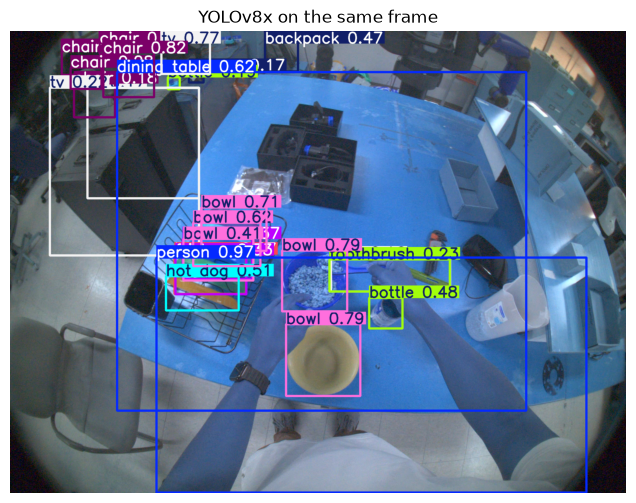

In [6]:
# Same frame, same code, a much larger model. If capacity was the problem this
# fixes it. If the labels stay wrong then the issue is the domain rather than
# the model. Off the shelf detection would then be a dead end for this footage.
model_big = YOLO(str(MODELS / "yolov8x.pt"))

results = model_big(task_frame, conf=0.15, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    print(f"{model_big.names[int(box.cls)]:<15} {float(box.conf):.2f}")

plt.figure(figsize=(8, 6))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("YOLOv8x on the same frame")
plt.show()

detections: 3

bowl                 0.71
bowl                 0.63
cereal               0.37


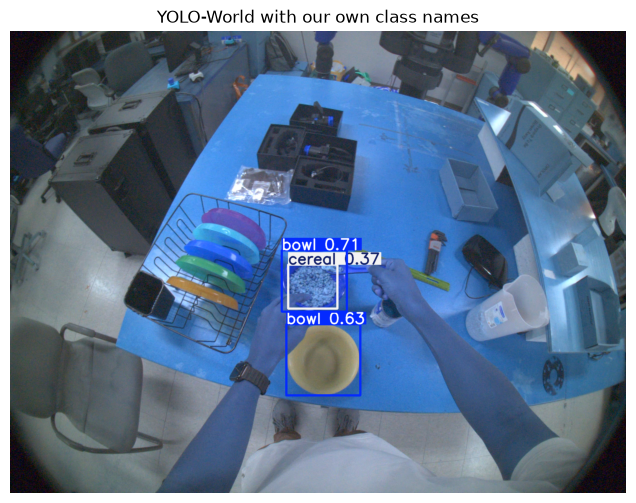

In [7]:
from ultralytics import YOLOWorld

# An open vocabulary model looks for the classes we name rather than the eighty
# COCO was built around. Our objects are lab items, so being able to say what
# they are should beat hoping one of the fixed classes fits.
world = YOLOWorld(str(MODELS / "yolov8x-worldv2.pt"))
world.set_classes(["bowl", "scoop", "cereal", "plastic container",
                   "water jug", "hand", "coloured ring"])

results = world(task_frame, conf=0.10, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    print(f"{world.names[int(box.cls)]:<20} {float(box.conf):.2f}")

plt.figure(figsize=(8, 6))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("YOLO-World with our own class names")
plt.show()

detections: 14

bowl                   0.68
bowl                   0.58
green handle           0.47
white plastic jug      0.40
cereal                 0.36
white plastic jug      0.25
plastic spoon          0.16
plastic spoon          0.13
plastic spoon          0.08
green handle           0.07
bowl                   0.06
white plastic jug      0.06
bowl                   0.06
green handle           0.06


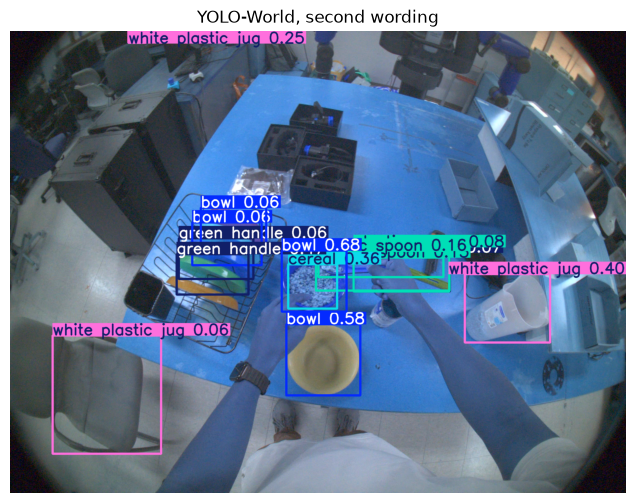

In [8]:
# The model found what we named well and ignored what we named badly. So the
# wording of a class is itself a parameter. We try more literal descriptions of
# what is actually in the frame. We also drop the confidence floor so we can see
# what it half noticed rather than only what it was sure about.
world.set_classes([
    "bowl", "cereal",
    "measuring scoop", "plastic spoon", "green handle",   # the held object, three ways
    "white plastic jug", "stack of plastic lids",
    "human hand", "arm",
])

results = world(task_frame, conf=0.05, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    print(f"{world.names[int(box.cls)]:<22} {float(box.conf):.2f}")

plt.figure(figsize=(8, 6))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("YOLO-World, second wording")
plt.show()

detections: 3

spoon 0.16   box (1002, 730) to (1436, 839)
spoon 0.08   box (1003, 728) to (1183, 800)
spoon 0.07   box (597, 628) to (819, 768)


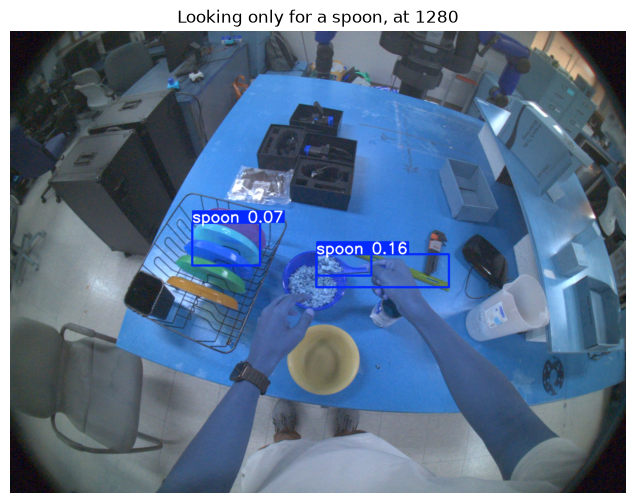

In [9]:
# A spoon is a common class that both models already know, so if detection is
# failing it is about size and occlusion rather than vocabulary. We give it one
# class to look for along with three times the pixels, then see whether that is
# enough.
world.set_classes(["spoon"])

results = world(task_frame, conf=0.05, imgsz=1280, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    print(f"spoon {float(box.conf):.2f}   box ({x1:.0f}, {y1:.0f}) to ({x2:.0f}, {y2:.0f})")

plt.figure(figsize=(8, 6))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("Looking only for a spoon, at 1280")
plt.show()

crop is 734 by 409 pixels
detections: 2

spoon 0.10
spoon 0.07


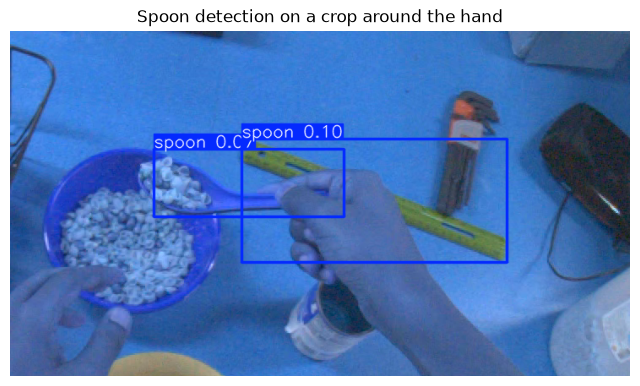

In [10]:
# We already know roughly where the spoon is, so we can test the cropping idea
# directly rather than building the hand projection first. Does a small object
# detect better when it fills the frame ? This answers that in one run.
x1, y1, x2, y2 = 1002, 730, 1436, 839

# We pad the box outwards, because a tight crop gives the model no context and
# detectors do badly when an object touches the image edge.
pad = 150
h, w = task_frame.shape[:2]
cx1, cy1 = max(0, x1 - pad), max(0, y1 - pad)
cx2, cy2 = min(w, x2 + pad), min(h, y2 + pad)

crop = task_frame[cy1:cy2, cx1:cx2]
print(f"crop is {crop.shape[1]} by {crop.shape[0]} pixels")

world.set_classes(["spoon"])
results = world(crop, conf=0.05, imgsz=1280, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    print(f"spoon {float(box.conf):.2f}")

plt.figure(figsize=(8, 5))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("Spoon detection on a crop around the hand")
plt.show()

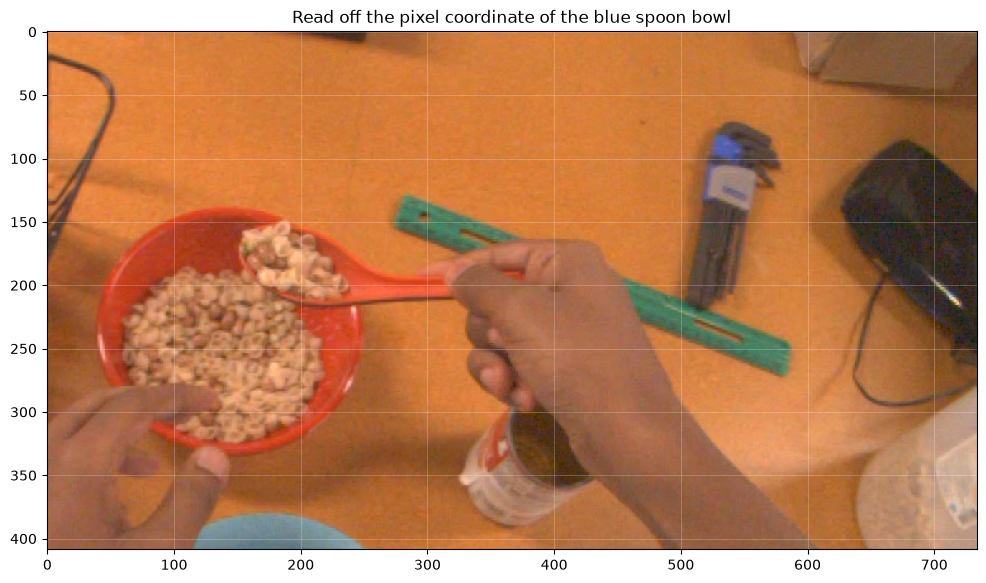

In [11]:
# SAM needs us to point at the thing we want. Rather than guessing a coordinate
# from a compressed screenshot, we draw the crop with axes on so the number can
# be read straight off the plot.
plt.figure(figsize=(12, 7))
plt.imshow(crop)
plt.grid(True, color="white", alpha=0.3, linewidth=0.5)
plt.title("Read off the pixel coordinate of the blue spoon bowl")
plt.show()

detections: 3

spoon 0.09   box (1003, 728) to (1185, 800)
spoon 0.08   box (1125, 710) to (1440, 854)
spoon 0.07   box (1003, 729) to (1445, 843)


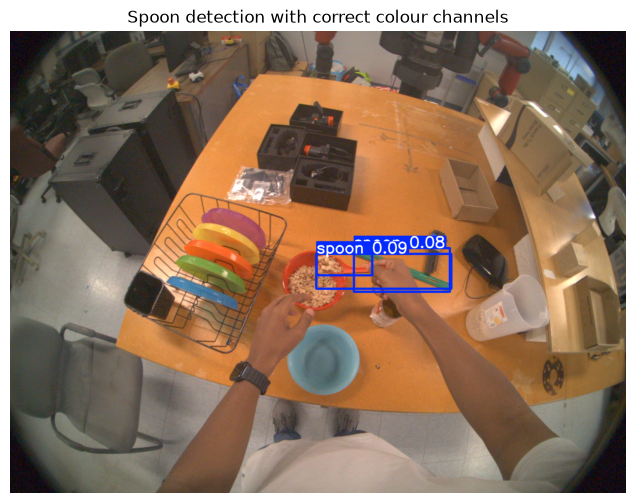

In [12]:
# Ultralytics expects BGR when you hand it a numpy array. Our frame comes out of
# the VRS as RGB. Every run so far fed it swapped channels, so the model was
# looking at a blue table with a blue spoon. We convert properly this time.
task_frame_bgr = task_frame[:, :, ::-1]

world.set_classes(["spoon"])
results = world(task_frame_bgr, conf=0.05, imgsz=1280, verbose=False)
r = results[0]

print(f"detections: {len(r.boxes)}\n")
for box in r.boxes:
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    print(f"spoon {float(box.conf):.2f}   box ({x1:.0f}, {y1:.0f}) to ({x2:.0f}, {y2:.0f})")

# plot() returns BGR, so reversing here gives us correct colours on screen. The
# table should now look orange rather than blue, which is how we know both the
# input and the display are finally the right way round.
plt.figure(figsize=(8, 6))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("Spoon detection with correct colour channels")
plt.show()

masks returned: 1


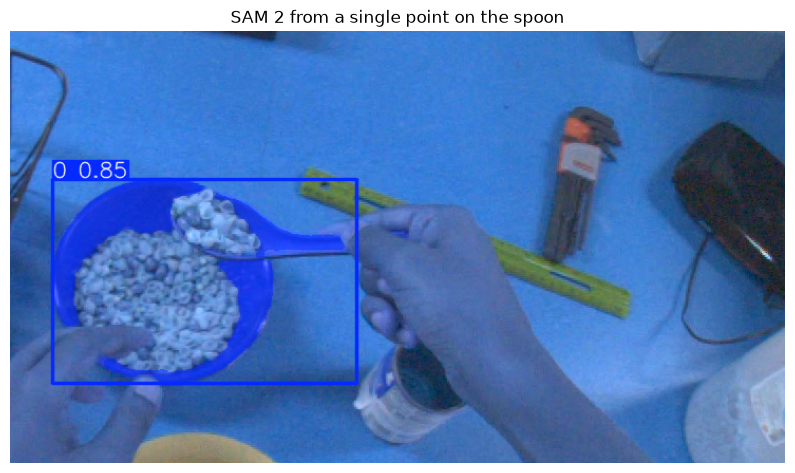

In [13]:
from ultralytics import SAM

# SAM does not search for anything. We give it one pixel and it works out the
# boundary of whatever object that pixel sits on, which sidesteps every problem
# we have hit tonight.
sam = SAM(str(MODELS / "sam2_b.pt"))

# Reading off the axes plot you produced, the spoon's scoop end sits at roughly
# x=230, y=185 in crop coordinates. Adjust these if my read is off.
spoon_x, spoon_y = 230, 185

results = sam(crop, points=[[spoon_x, spoon_y]], labels=[1], verbose=False)
r = results[0]

print(f"masks returned: {len(r.masks) if r.masks is not None else 0}")

plt.figure(figsize=(10, 6))
plt.imshow(r.plot()[:, :, ::-1])
plt.axis("off")
plt.title("SAM 2 from a single point on the spoon")
plt.show()

masks returned: 1


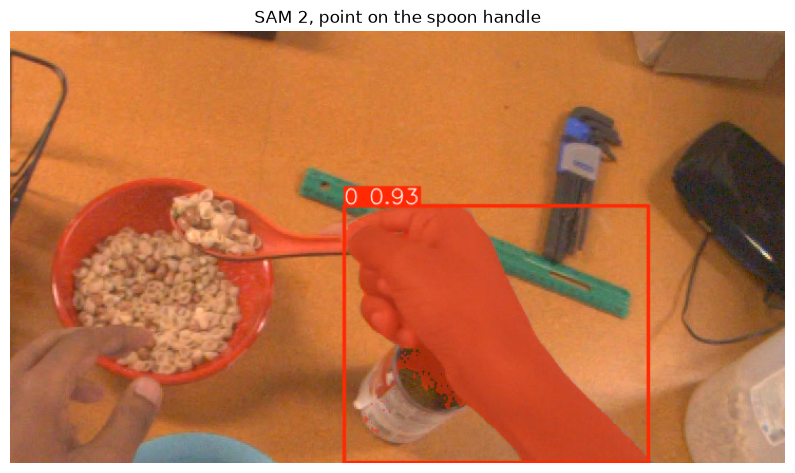

In [14]:
# Pointing at the scoop end caught the bowl too, because at that pixel the spoon
# is sitting inside it. The handle is unambiguous, so we point there instead.
spoon_x, spoon_y = 320, 200

results = sam(crop, points=[[spoon_x, spoon_y]], labels=[1], verbose=False)
r = results[0]

print(f"masks returned: {len(r.masks) if r.masks is not None else 0}")

# crop is already RGB and plot returns BGR, so we swap once to get back to RGB
# for display. Getting this wrong is what produced the blue table earlier.
plt.figure(figsize=(10, 6))
plt.imshow(r.plot()[:, :, ::-1][:, :, ::-1])
plt.axis("off")
plt.title("SAM 2, point on the spoon handle")
plt.show()

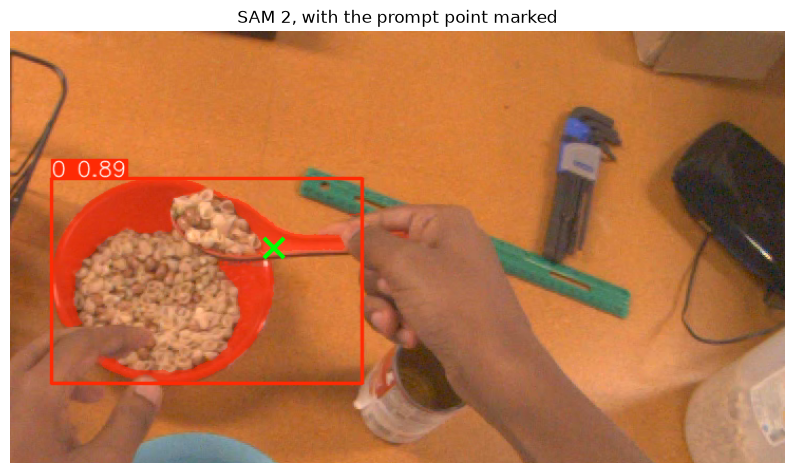

In [15]:
# My last point landed on the hand. The handle runs diagonally between the bowl
# and the fingers, so we aim for the middle of that stretch instead.
spoon_x, spoon_y = 250, 205

results = sam(crop, points=[[spoon_x, spoon_y]], labels=[1], verbose=False)
r = results[0]

# Drawing the point we asked for on top of the result, so if the mask is wrong
# again we can see immediately whether the point was misplaced or SAM misread it.
out = r.plot()[:, :, ::-1][:, :, ::-1]

plt.figure(figsize=(10, 6))
plt.imshow(out)
plt.plot(spoon_x, spoon_y, "x", color="lime", markersize=14, markeredgewidth=3)
plt.axis("off")
plt.title("SAM 2, with the prompt point marked")
plt.show()

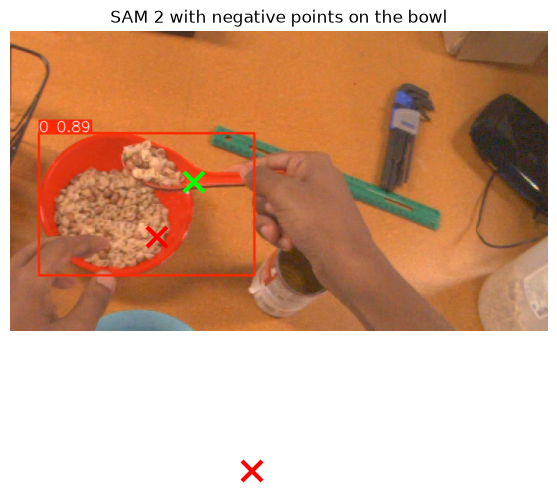

In [16]:
# The spoon and the bowl are the same red plastic and they are touching, so a
# single positive point pulls in both. We add points we explicitly do not want,
# which tells SAM where the boundary between the two should fall.
positive = [[250, 205]]                       # on the spoon handle
negative = [[200, 280], [330, 600]]           # inside the cereal, and the bowl rim

points = positive + negative
labels = [1] + [0] * len(negative)

results = sam(crop, points=points, labels=labels, verbose=False)
r = results[0]

out = r.plot()[:, :, ::-1][:, :, ::-1]

plt.figure(figsize=(10, 6))
plt.imshow(out)
for (px, py), lab in zip(points, labels):
    # Green for what we want, red for what we are pushing away, so a wrong result
    # is easy to diagnose from the picture rather than from the numbers.
    plt.plot(px, py, "x", color="lime" if lab else "red",
             markersize=14, markeredgewidth=3)
plt.axis("off")
plt.title("SAM 2 with negative points on the bowl")
plt.show()

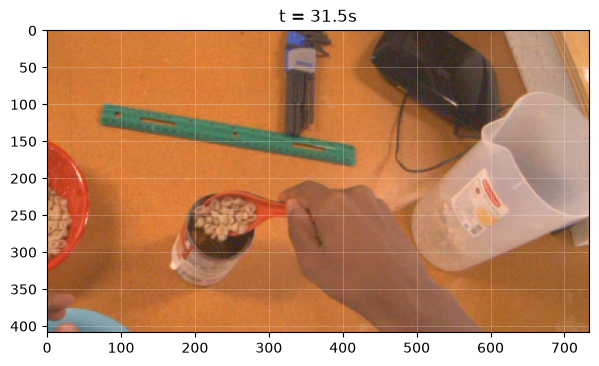

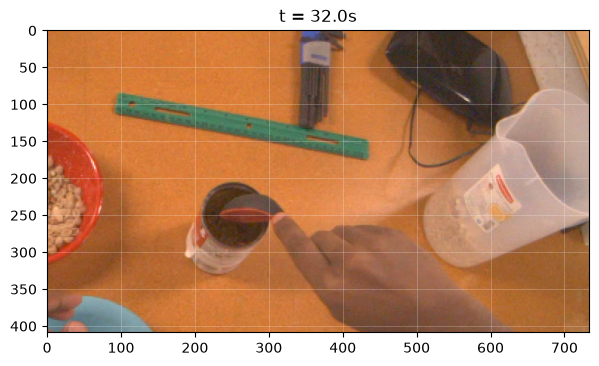

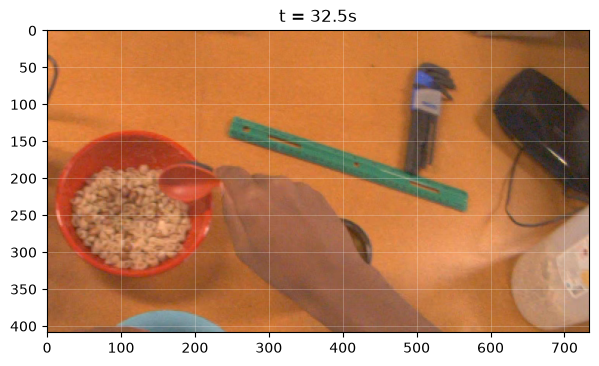

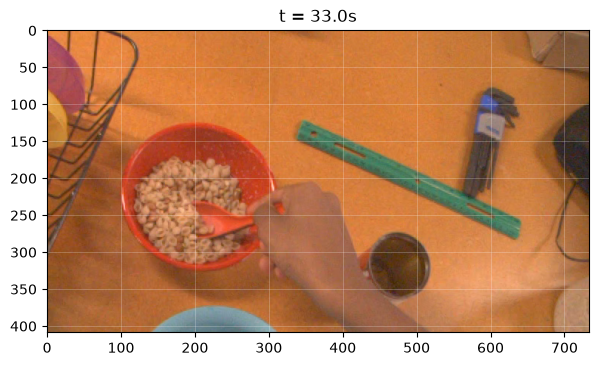

In [17]:
# Rather than fighting a frame where the spoon and bowl are touching, we look
# for one where the spoon has been lifted clear. Is that cheating ? No, the
# transfer is the part of the motion we actually want to track.
for t in [31.5, 32.0, 32.5, 33.0]:
    d, rec = vrs_data_provider.get_image_data_by_time_ns(
        rgb_stream_id, first_ns + int(t * 1e9),
        TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST)
    plt.figure(figsize=(7, 4))
    plt.imshow(d.to_numpy_array()[cy1:cy2, cx1:cx2])
    plt.grid(True, color="white", alpha=0.3, linewidth=0.5)
    plt.title(f"t = {t}s")
    plt.show()

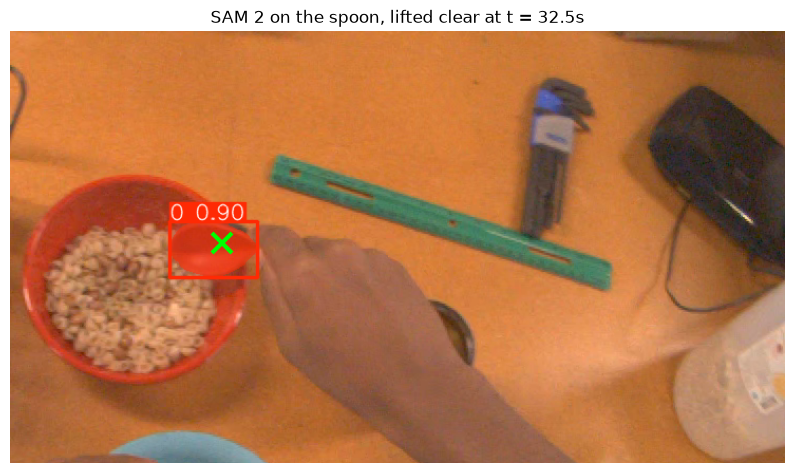

In [18]:
# The spoon is clear of the bowl here and surrounded by table, so there is an
# actual boundary for SAM to find rather than two touching red objects.
d, rec = vrs_data_provider.get_image_data_by_time_ns(
    rgb_stream_id, first_ns + int(32.5 * 1e9),
    TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST)
frame_325 = d.to_numpy_array()[cy1:cy2, cx1:cx2]

# Reading off the grid, the spoon's scoop sits around x=200, y=200, just right
# of the bowl rim and above the fingers.
spoon_x, spoon_y = 200, 200

results = sam(frame_325, points=[[spoon_x, spoon_y]], labels=[1], verbose=False)
r = results[0]

out = r.plot()[:, :, ::-1][:, :, ::-1]

plt.figure(figsize=(10, 6))
plt.imshow(out)
plt.plot(spoon_x, spoon_y, "x", color="lime", markersize=14, markeredgewidth=3)
plt.axis("off")
plt.title("SAM 2 on the spoon, lifted clear at t = 32.5s")
plt.show()

In [19]:
from ultralytics import SAM
import inspect

sam = SAM(str(MODELS / "sam2_b.pt"))

# Does this wrapper carry a mask forward through video or does it only do one
# frame at a time ? If it is single frame only, we need Meta's own sam2 package
# for the video predictor and that changes what we build.
print([m for m in dir(sam) if not m.startswith("_")])
print()
print(inspect.signature(sam.predict))

['T_destination', 'add_callback', 'add_module', 'apply', 'benchmark', 'bfloat16', 'buffers', 'calibrate', 'call_super_init', 'callbacks', 'cfg', 'children', 'ckpt', 'ckpt_path', 'clear_callback', 'compile', 'cpu', 'cuda', 'device', 'double', 'dump_patches', 'embed', 'eval', 'export', 'extra_repr', 'float', 'forward', 'fuse', 'get_buffer', 'get_extra_state', 'get_parameter', 'get_submodule', 'half', 'info', 'ipu', 'is_sam2', 'is_sam3', 'is_triton_model', 'load', 'load_state_dict', 'metrics', 'model', 'model_name', 'modules', 'mtia', 'named_buffers', 'named_children', 'named_modules', 'named_parameters', 'names', 'overrides', 'parameters', 'predict', 'predictor', 'register_backward_hook', 'register_buffer', 'register_forward_hook', 'register_forward_pre_hook', 'register_full_backward_hook', 'register_full_backward_pre_hook', 'register_load_state_dict_post_hook', 'register_load_state_dict_pre_hook', 'register_module', 'register_parameter', 'register_state_dict_post_hook', 'register_state_

In [20]:
# The Model wrapper looks single frame. Ultralytics usually puts video mask
# propagation in a dedicated predictor, so we check whether that class exists
# in this installed version rather than assuming it does.
import ultralytics.models.sam as sam_mod

print([n for n in dir(sam_mod) if not n.startswith("_")])
print()
print("is_sam2:", sam.is_sam2)
print("is_sam3:", sam.is_sam3)

['Predictor', 'SAM', 'SAM2DynamicInteractivePredictor', 'SAM2Predictor', 'SAM2VideoPredictor', 'SAM3Predictor', 'SAM3SemanticPredictor', 'SAM3VideoPredictor', 'SAM3VideoSemanticPredictor', 'amg', 'build', 'model', 'modules', 'predict']

is_sam2: True
is_sam3: False


In [21]:
import os
from pathlib import Path
from PIL import Image

# NOTE: this export is no longer used by anything below. It writes 570 full
# resolution frames into frames_pour_18_37. The video predictor reads
# frames_fwd_325_37 instead, which cell 22 creates. We keep the code because it
# documents how the wider 18 to 37 second window was exported, but we skip the
# work by default. Set EXPORT_WIDE_WINDOW to True if you ever need that folder.
EXPORT_WIDE_WINDOW = False

out_dir = CACHE / "frames_pour_18_37"

if not EXPORT_WIDE_WINDOW:
    print("skipping the wide window export, nothing downstream reads it")
else:
    out_dir.mkdir(parents=True, exist_ok=True)

    start_s, end_s = 18.0, 37.0
    fps = 30.0

    # We keep the full frame rather than the crop we were using. The crop was
    # fixed in place while your head kept moving, so the spoon would wander out
    # of it.
    n_written = 0
    t = start_s
    while t <= end_s:
        d, rec = vrs_data_provider.get_image_data_by_time_ns(
            rgb_stream_id, first_ns + int(t * 1e9),
            TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST)
        if d.is_valid():
            # Zero padded names so the predictor reads them in the right order.
            # Are filenames really load bearing here ? Yes, ordering is how the
            # propagation knows which frame follows which.
            Image.fromarray(d.to_numpy_array()).save(out_dir / f"{n_written:05d}.jpg", quality=92)
            n_written += 1
        t += 1.0 / fps

    print(f"wrote {n_written} frames to {out_dir}")

skipping the wide window export, nothing downstream reads it


In [22]:
import inspect
from ultralytics.models.sam import SAM2VideoPredictor

# We read the real signature rather than guessing. Video predictors vary a lot
# between versions in how they take the initial prompt and how they hand back
# the propagated masks, so this is worth thirty seconds.
print(inspect.signature(SAM2VideoPredictor.__init__))
print()

# The methods that matter are the ones for setting a prompt on a starting frame
# and for stepping the mask through the rest.
print([m for m in dir(SAM2VideoPredictor) if not m.startswith("_")])
print()

# And the docstring often says outright whether it wants a folder or a video.
print(inspect.getdoc(SAM2VideoPredictor))

(self, cfg=IterableSimpleNamespace(task='detect', mode='train', model=None, data=None, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, cls_remap=True, optimizer='auto', verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=0.0, compile=False, channels_last=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split='val', save_json=False, conf=None, iou=0.7, max_det=300, quantize=None, dnn=False, plots=True, nms=None, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format='torchscr

In [23]:
print("crop offset:", cx1, cy1)
print("prompt point in full frame:", 200 + cx1, 200 + cy1)

crop offset: 852 580
prompt point in full frame: 1052 780


In [24]:
# The video predictor takes its prompt on frame zero and propagates forward, so
# the folder has to begin at the moment we have a good click. We also keep this
# short, because SAM carries a memory state across every frame and that gets
# expensive on CPU.
fwd_dir = CACHE / "frames_fwd_325_37"
fwd_dir.mkdir(parents=True, exist_ok=True)

# How many frames should this window hold ? Four and a half seconds at thirty a
# second, so 136. If that many are already on disk then nothing has changed and
# we can skip several hundred JPEG encodes.
EXPECTED_FRAMES = 136

existing = sorted(fwd_dir.glob("*.jpg"))

if len(existing) >= EXPECTED_FRAMES:
    n = len(existing)
    print(f"{n} frames already present in {fwd_dir.name}, skipping export")
else:
    n = 0
    t = 32.5
    while t <= 37.0:
        d, rec = vrs_data_provider.get_image_data_by_time_ns(
            rgb_stream_id, first_ns + int(t * 1e9),
            TimeDomain.DEVICE_TIME, TimeQueryOptions.CLOSEST)
        if d.is_valid():
            Image.fromarray(d.to_numpy_array()).save(fwd_dir / f"{n:05d}.jpg", quality=92)
            n += 1
        t += 1.0 / 30.0

    print(f"wrote {n} frames")

136 frames already present in frames_fwd_325_37, skipping export


In [25]:
import cv2

# The predictor tracks frame numbers through the dataset. That counter only
# exists for video sources. So we give it an actual video rather than a folder.
video_path = str(CACHE / "pour_fwd_325_37.mp4")

if Path(video_path).exists():
    print(f"video already exists at {video_path}, skipping encode")
else:
    # Reading the first frame tells us the size to open the writer with, rather
    # than hardcoding a resolution that might not match.
    sample = cv2.imread(str(fwd_dir / "00000.jpg"))
    h, w = sample.shape[:2]

    writer = cv2.VideoWriter(video_path, cv2.VideoWriter_fourcc(*"mp4v"), 30.0, (w, h))

    # The frames on disk are already BGR as far as cv2 is concerned, because
    # imread reads them back that way. So we pass them straight through without
    # swapping.
    files = sorted(fwd_dir.glob("*.jpg"))
    for f in files:
        writer.write(cv2.imread(str(f)))
    writer.release()

    print(f"wrote {len(files)} frames to {video_path}")

video already exists at /Users/harshdas/Desktop/Rinzler/Stony Brook University/Advanced Project/Meta-Aria-Gen-2-Robotics/cache/pour_fwd_325_37.mp4, skipping encode


In [26]:
from ultralytics.models.sam import SAM2VideoPredictor

# This is the expensive cell. SAM runs its image encoder on every frame and
# keeps a memory bank across the whole sequence, which takes several minutes on
# CPU. Once we have the centroids there is no reason to pay that again, so we
# cache them and skip the propagation when the cache is there.
centres_cache = CACHE / "spoon_centres_325_37.npy"

# Set this to True when you want to force the propagation to run again, for eg.
# after changing the prompt point or the source video.
FORCE_PROPAGATION = False

if centres_cache.exists() and not FORCE_PROPAGATION:
    # results stays None so the cells below know to read the cache instead. Do
    # we lose anything by not having the masks ? Only the overlay panel, which
    # cell 26 skips accordingly.
    results = None
    print(f"cached centroids found at {centres_cache.name}, skipping propagation")
    print("set FORCE_PROPAGATION = True to run it again")
else:
    # Overrides is how this class takes its configuration, since its constructor
    # wants a full config namespace rather than plain arguments.
    overrides = dict(conf=0.25, task="segment", mode="predict",
                     imgsz=1024, model=str(MODELS / "sam2_b.pt"), save=False, verbose=False)

    # A fresh predictor each time, because the class holds an inference state
    # across frames and we do not want a previous run bleeding into this one.
    predictor = SAM2VideoPredictor(overrides=overrides)
    results = predictor(source=video_path, points=[[1052, 780]], labels=[1])

    print(f"frames returned: {len(results)}")

cached centroids found at spoon_centres_325_37.npy, skipping propagation
set FORCE_PROPAGATION = True to run it again


In [27]:
import numpy as np

# Each result carries the mask for that frame. We take the centre of the mask as
# the spoon's position, which gives us one point per frame and therefore a
# trajectory. Are we losing information by collapsing a mask to a point ? Yes,
# but position is what a robot needs and the shape is not.
if results is None:
    centres = np.load(centres_cache)
    frames_with_mask = int((~np.isnan(centres[:, 1])).sum())
    print(f"loaded {len(centres)} centroids from cache")
else:
    centres = []
    frames_with_mask = 0

    for i, r in enumerate(results):
        if r.masks is None or len(r.masks) == 0:
            # SAM lost the object on this frame. We record the gap rather than
            # skipping it silently, because a gap is information about tracking
            # quality and we learned how much gaps matter on the hand data.
            centres.append((i, np.nan, np.nan))
            continue

        frames_with_mask += 1
        m = r.masks.data[0].cpu().numpy()

        # The mask is a boolean image, so the mean of the pixel coordinates
        # where it is true gives us the centroid.
        ys, xs = np.nonzero(m)
        centres.append((i, xs.mean(), ys.mean()))

    centres = np.array(centres, dtype=float)

    # Saving here is what lets the cell above skip the propagation next time.
    np.save(centres_cache, centres)
    print(f"saved centroids to {centres_cache.name}")

print(f"frames: {len(centres)}")
print(f"frames with a mask: {frames_with_mask}")
print(f"tracking held for: {frames_with_mask / len(centres) * 100:.1f}% of frames")

loaded 136 centroids from cache
frames: 136
frames with a mask: 136
tracking held for: 100.0% of frames


propagation was skipped, so there are no masks to overlay
set FORCE_PROPAGATION = True above if you want this panel back


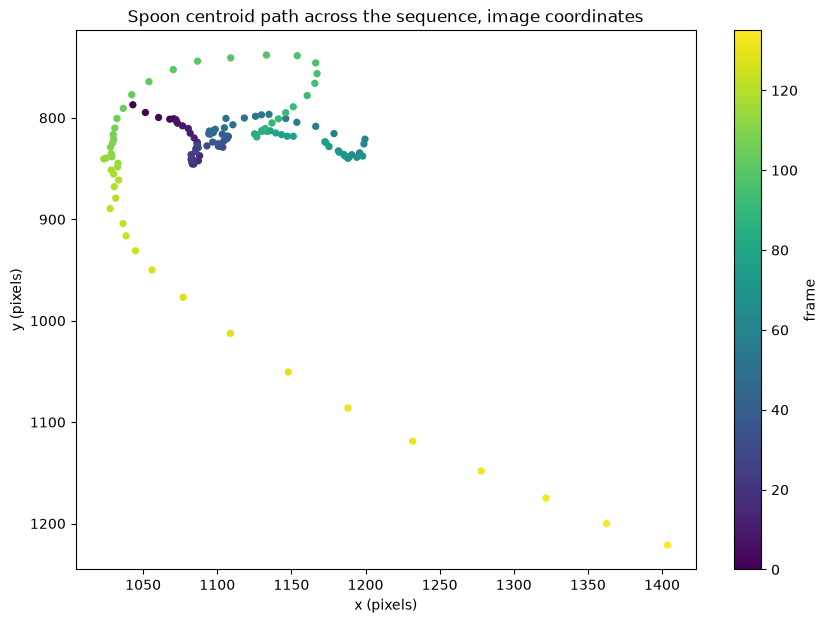

In [28]:
# A mask on every frame is only good news if it is the right mask. We overlay
# the result on a handful of frames spread across the sequence, so drift onto
# another object would be obvious rather than hidden behind a percentage.
if results is None:
    print("propagation was skipped, so there are no masks to overlay")
    print("set FORCE_PROPAGATION = True above if you want this panel back")
else:
    # We clamp the indices to the sequence length rather than hardcoding them,
    # so a shorter run does not fall over on the last panel.
    check_idx = [i for i in [0, 30, 60, 90, len(results) - 1] if i < len(results)]

    fig, axes = plt.subplots(1, len(check_idx), figsize=(22, 5))
    for ax, idx in zip(axes, check_idx):
        r = results[idx]
        ax.imshow(r.plot()[:, :, ::-1])
        cx, cy = centres[idx, 1], centres[idx, 2]
        ax.plot(cx, cy, "x", color="lime", markersize=12, markeredgewidth=3)
        ax.set_title(f"frame {idx}, t = {32.5 + idx/30:.2f}s")
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# The path itself, in image pixels. Remember this is not yet a path through the
# room, because the camera is on your head and moves the whole time.
valid = ~np.isnan(centres[:, 1])

fig, ax = plt.subplots(figsize=(10, 7))
sc = ax.scatter(centres[valid, 1], centres[valid, 2],
                c=centres[valid, 0], cmap="viridis", s=18)
ax.invert_yaxis()   # image y runs downwards, so we flip it to read naturally
ax.set_xlabel("x (pixels)")
ax.set_ylabel("y (pixels)")
ax.set_title("Spoon centroid path across the sequence, image coordinates")
plt.colorbar(sc, ax=ax, label="frame")
plt.show()

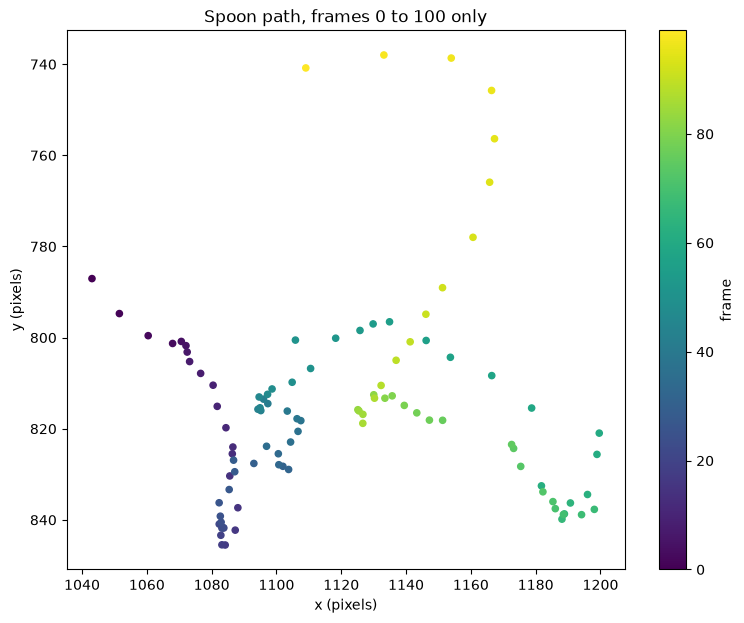

In [29]:
# The plot mixes real tracking with the drift after the spoon leaves view, which
# makes both harder to read. We cut at frame 100 and look at what we trust.
good = centres[:100]

fig, ax = plt.subplots(figsize=(9, 7))
sc = ax.scatter(good[:, 1], good[:, 2], c=good[:, 0], cmap="viridis", s=20)
ax.invert_yaxis()
ax.set_xlabel("x (pixels)")
ax.set_ylabel("y (pixels)")
ax.set_title("Spoon path, frames 0 to 100 only")
plt.colorbar(sc, ax=ax, label="frame")
plt.show()